In [7]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import AUC
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split


In [45]:
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.layers import Input

# Load your Sequential model
sequential_model = load_model("script_results/autoencoded_cnn_breast.keras")

# Create Functional model
input_shape = sequential_model.input_shape[1:]  # (56, 56, 16) expected
inputs = Input(shape=input_shape)
x = inputs
for layer in sequential_model.layers:
    x = layer(x)
functional_model = Model(inputs, x, name="functional_autoencoded_classifier")

# Save the functional version
functional_model.save("script_results/functional_autoencoded_cnn_breast.keras")


In [58]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input

# ---------------------
# Load the models
# ---------------------
encoder = load_model("script_results/breastencoder_model.keras")         # e.g., from autoencoder save step
decoder = load_model("script_results/breastdecoder_model.keras")         # decoder model
classifier = load_model("script_results/functional_autoencoded_cnn_breast.keras")  # functional classifier

# ---------------------
# Grad-CAM
# ---------------------
def grad_cam(model, image, layer_name='conv2d_10'):
    """
    Compute Grad-CAM heatmap from the functional CNN classifier.
    """
    image_input = tf.expand_dims(image, axis=0)

    # Ensure model is built and outputs match
    _ = model.predict(image_input, verbose=0)

    # Get the target convolutional layer
    target_layer = model.get_layer(layer_name)
    grad_model = Model([model.inputs], [target_layer.output, model.output])

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(image_input)
        loss = predictions[:, 0]

    grads = tape.gradient(loss, conv_outputs)
    if grads is None:
        raise ValueError("Gradient calculation failed. Check model input.")

    grads = grads[0]
    conv_outputs = conv_outputs[0]
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1))

    cam = tf.reduce_sum(conv_outputs * pooled_grads, axis=-1).numpy()
    cam = np.maximum(cam, 0)
    cam = cam / (np.max(cam) + 1e-8)

    return cam


# ---------------------
# Score-CAM
# ---------------------
def score_cam(model, image, layer_name='conv2d_10', max_N=32):
    input_tensor = tf.expand_dims(image, axis=0)
    
    # Get the activation map from the convolutional layer
    conv_layer = model.get_layer(layer_name)
    activation_model = Model(inputs=model.inputs, outputs=[conv_layer.output, model.output])

    # Run model to get feature maps
    feature_maps, _ = activation_model(input_tensor)
    feature_maps = feature_maps[0].numpy()

    h, w, n_features = feature_maps.shape
    cam = np.zeros((image.shape[0], image.shape[1]), dtype=np.float32)  # Use encoded image size

    for i in range(min(n_features, max_N)):
        fmap = feature_maps[:, :, i]
        # Normalize
        fmap_norm = (fmap - np.min(fmap)) / (np.max(fmap) - np.min(fmap) + 1e-5)
        # Resize to match encoded input image shape
        upsampled = cv2.resize(fmap_norm, (image.shape[1], image.shape[0]))
        # Apply upsampled mask to input image
        masked_input = image * upsampled[..., np.newaxis]

        score = model.predict(np.expand_dims(masked_input, axis=0), verbose=0)[0][0]
        cam += upsampled * score  # Safe now since shape matches

    cam = np.maximum(cam, 0)
    cam = cam / (np.max(cam) + 1e-8)
    return cam



# ---------------------
# Overlay heatmap
# ---------------------
def overlay_on_original(heatmap, encoded_img, original_img, decoder, alpha=0.4):
    decoded_img = decoder.predict(np.expand_dims(encoded_img, axis=0), verbose=0)[0]
    heatmap_resized = cv2.resize(heatmap, (224, 224))
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    overlay = np.uint8(255 * (alpha * heatmap_colored / 255 + (1 - alpha) * decoded_img))
    return overlay

# ---------------------
# Run and plot CAMs
# ---------------------
def visualize_cam(X, y, encoder, decoder, classifier, cam_type="grad", num_samples=3):
    """
    Visualize CAM overlays for tumor cases only.
    """
    tumor_indices = [i for i, label in enumerate(y) if label == 1]

    for i in tumor_indices[:num_samples]:
        original = X[i]
        encoded = encoder.predict(np.expand_dims(original, axis=0), verbose=0)[0]

        if cam_type == "grad":
            heatmap = grad_cam(classifier, encoded, layer_name="conv2d_10")
            title = "Grad-CAM"
        elif cam_type == "score":
            heatmap = score_cam(classifier, encoded, layer_name="conv2d_10")
            title = "Score-CAM"
        else:
            raise ValueError("cam_type must be 'grad' or 'score'")

        overlay = overlay_on_original(heatmap, encoded, original, decoder)

        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(original)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(overlay)
        plt.title(f"{title} Overlay")
        plt.axis('off')
        plt.tight_layout()
        plt.show()



In [74]:
def visualize_cam_comparison(
    X, y, encoder, decoder, classifier, 
    layer_name="conv2d_8", num_samples=5, filter_label=1,
    savefig=False, filename_prefix="cam_comparison"
):
    """
    Visualizes original image, Grad-CAM, and Score-CAM side-by-side for samples with a specified true label.
    
    Args:
        X: Original image dataset
        y: True labels (0 or 1)
        encoder: Trained encoder model
        decoder: Trained decoder model
        classifier: Trained classifier (functional)
        layer_name: Name of conv layer to use for CAMs
        num_samples: Number of samples to visualize
        filter_label: 1 for Tumor, 0 for Normal
        savefig: If True, saves each figure as PNG
        filename_prefix: Prefix used for saved image files
    """
    import os
    os.makedirs("figures", exist_ok=True)

    class_names = {0: "Normal", 1: "Tumor"}
    filtered_indices = [i for i, label in enumerate(y) if label == filter_label]

    for idx, i in enumerate(filtered_indices[:num_samples]):
        original = X[i]
        true_label = y[i]
        encoded = encoder.predict(np.expand_dims(original, axis=0), verbose=0)[0]

        # Predict
        pred_prob = classifier.predict(np.expand_dims(encoded, axis=0), verbose=0)[0][0]
        pred_label = int(pred_prob > 0.5)
        pred_name = class_names[pred_label]
        true_name = class_names[true_label]

        # Grad-CAM
        heatmap_grad = grad_cam(classifier, encoded, layer_name=layer_name)
        overlay_grad = overlay_on_original(heatmap_grad, encoded, original, decoder)

        # Score-CAM
        heatmap_score = score_cam(classifier, encoded, layer_name=layer_name)
        overlay_score = overlay_on_original(heatmap_score, encoded, original, decoder)

        # Plot
        plt.figure(figsize=(10,3.5))

        plt.subplot(1, 3, 1)
        plt.imshow(original)
        plt.title(f"Original\nTrue: {true_name}")
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(overlay_grad)
        plt.title(f"Grad-CAM\nPred: {pred_name} ({pred_prob:.2f})")
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(overlay_score)
        plt.title(f"Score-CAM\nPred: {pred_name} ({pred_prob:.2f})")
        plt.axis('off')

        plt.tight_layout()

        if savefig:
            filename = f"figures/{filename_prefix}_sample{idx}_true{true_name}_pred{pred_name}.png"
            plt.savefig(filename, dpi=300, bbox_inches='tight')
            print(f"Saved: {filename}")

        plt.show()


In [65]:
classifier.summary()

Model: "functional_autoencoded_classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 56, 56, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 54, 54, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 27, 27, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 25, 25, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 12, 12, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 10, 10, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 5, 5, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 3200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       409,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 506,849 (1.93 MB)

 Trainable params: 506,849 (1.93 MB)

 Non-trainable params: 0 (0.00 B)

Saved: figures/conv2d_8_sample0_trueNormal_predNormal.png


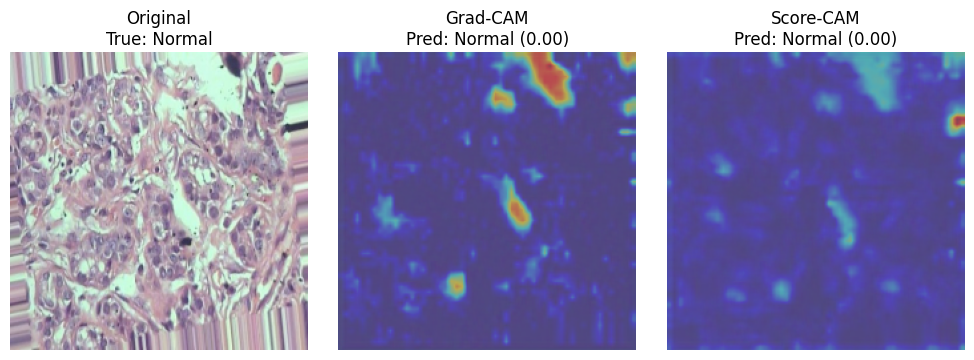

Saved: figures/conv2d_8_sample1_trueNormal_predNormal.png


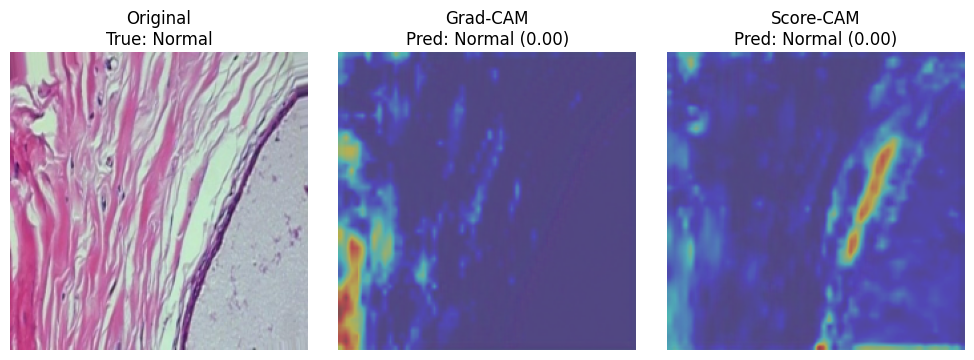

Saved: figures/conv2d_8_sample2_trueNormal_predNormal.png


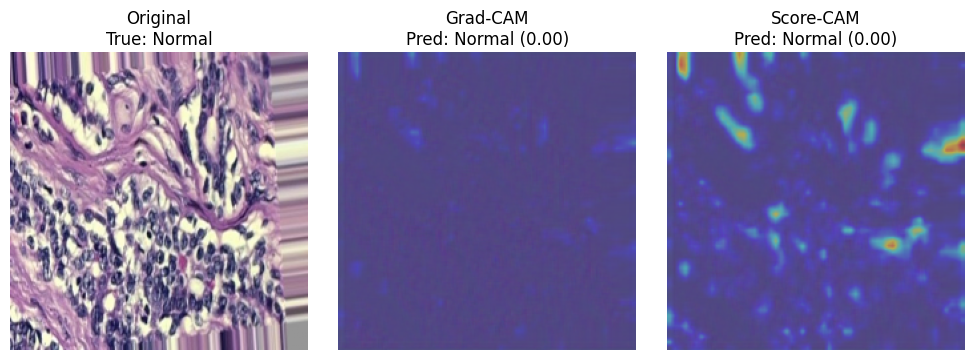

Saved: figures/conv2d_8_sample3_trueNormal_predNormal.png


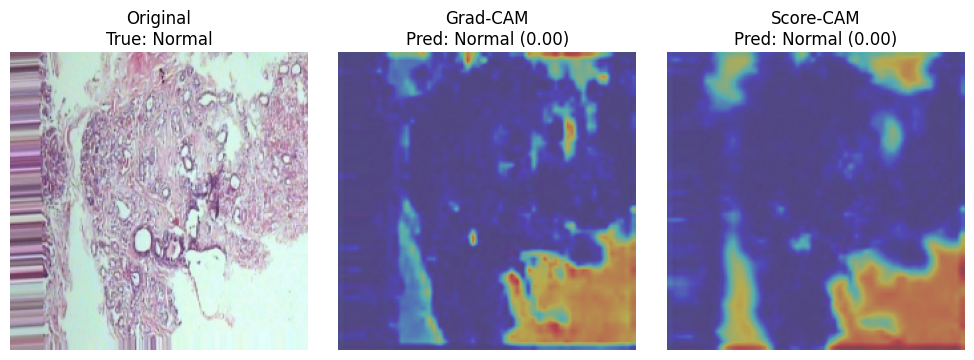

Saved: figures/conv2d_8_sample4_trueNormal_predNormal.png


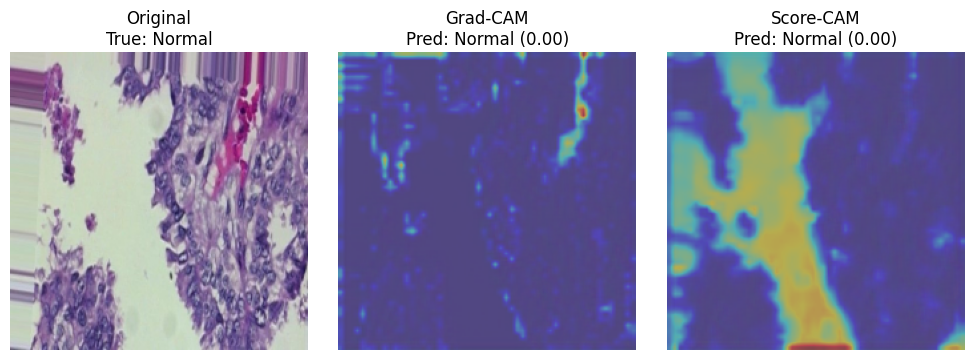

Saved: figures/conv2d_8_sample5_trueNormal_predNormal.png


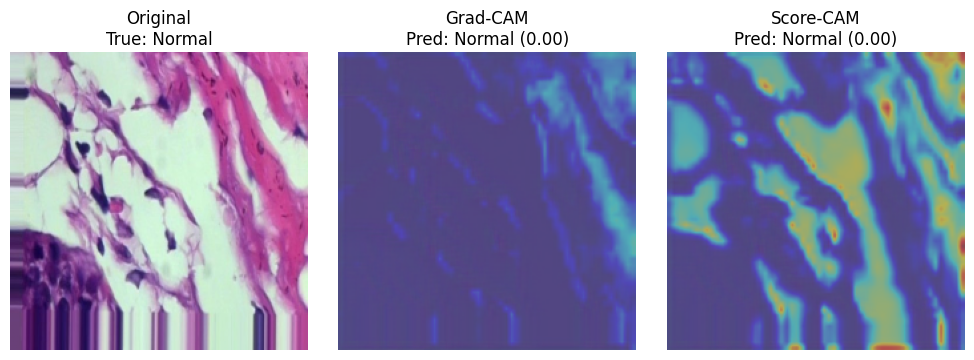

Saved: figures/conv2d_8_sample6_trueNormal_predNormal.png


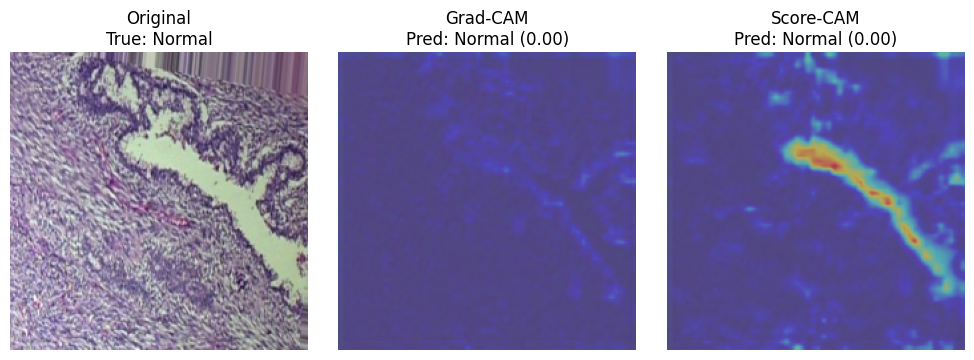

Saved: figures/conv2d_8_sample7_trueNormal_predNormal.png


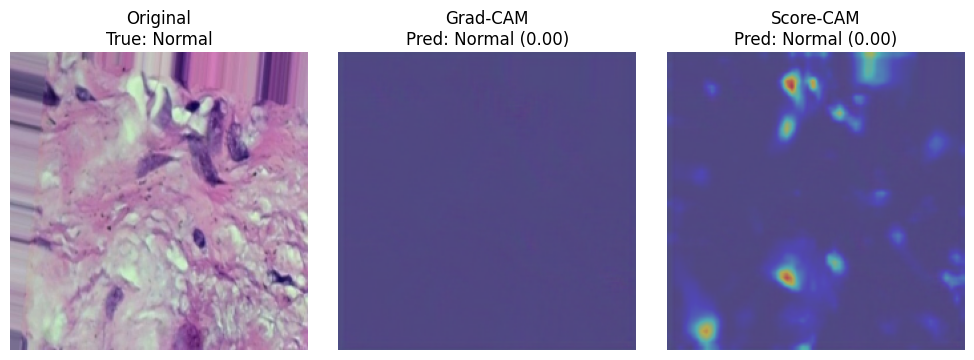

Saved: figures/conv2d_8_sample8_trueNormal_predNormal.png


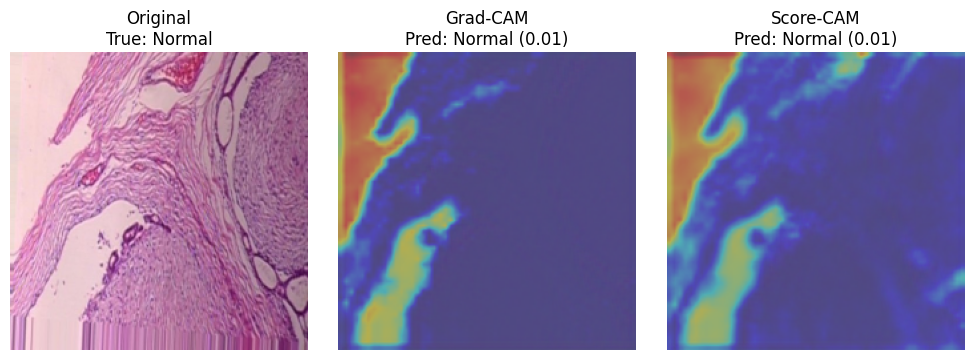

Saved: figures/conv2d_8_sample9_trueNormal_predNormal.png


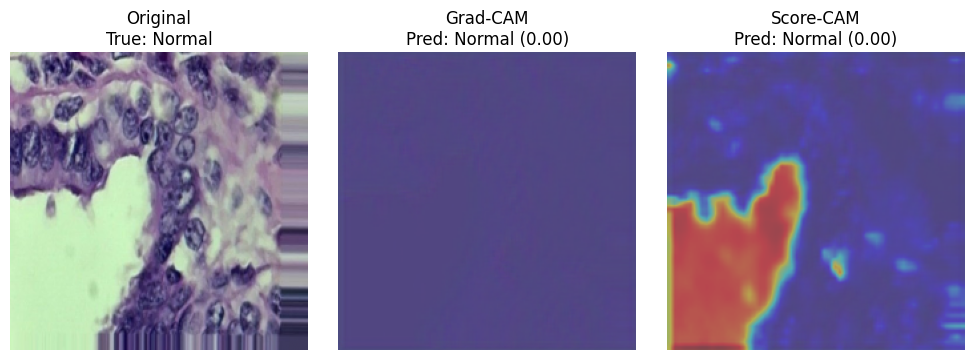

Saved: figures/conv2d_8_sample10_trueNormal_predNormal.png


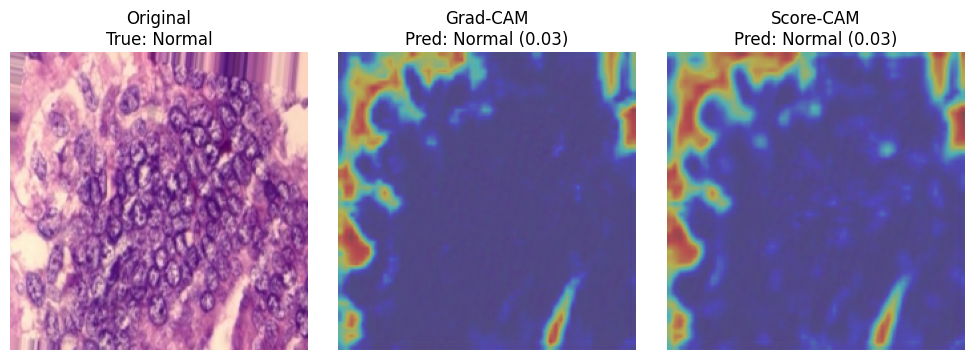

Saved: figures/conv2d_8_sample11_trueNormal_predNormal.png


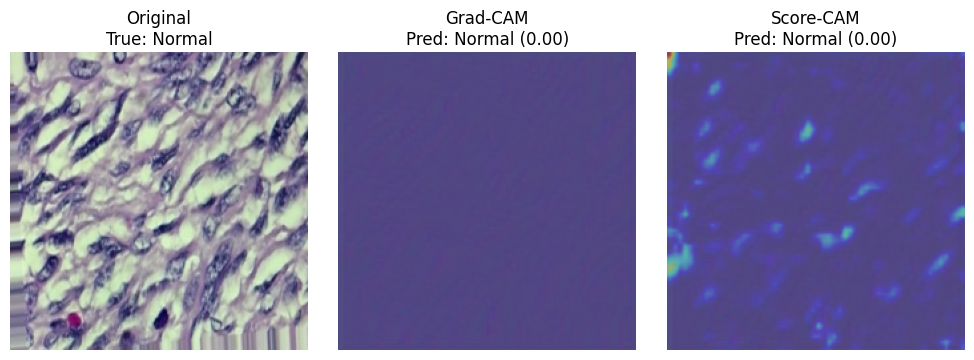

Saved: figures/conv2d_8_sample12_trueNormal_predNormal.png


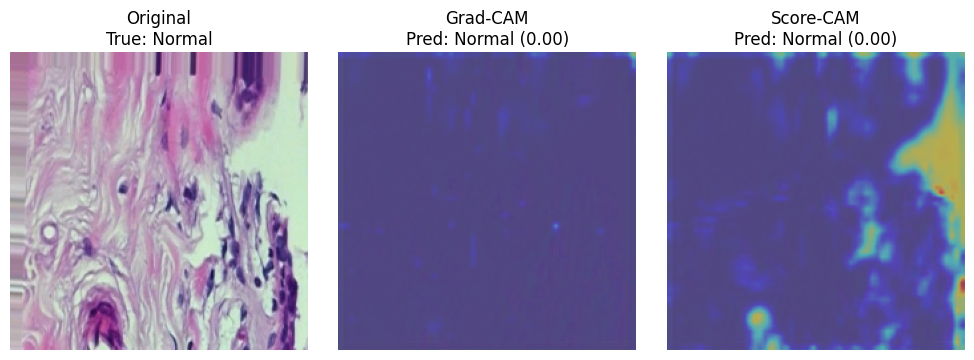

Saved: figures/conv2d_8_sample13_trueNormal_predNormal.png


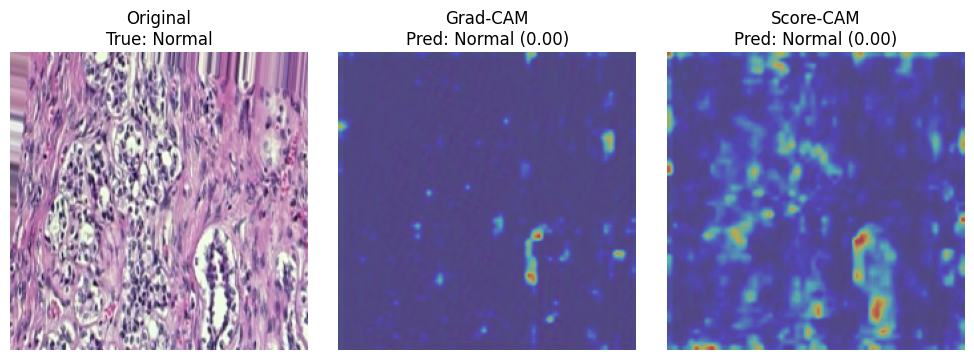

Saved: figures/conv2d_8_sample14_trueNormal_predNormal.png


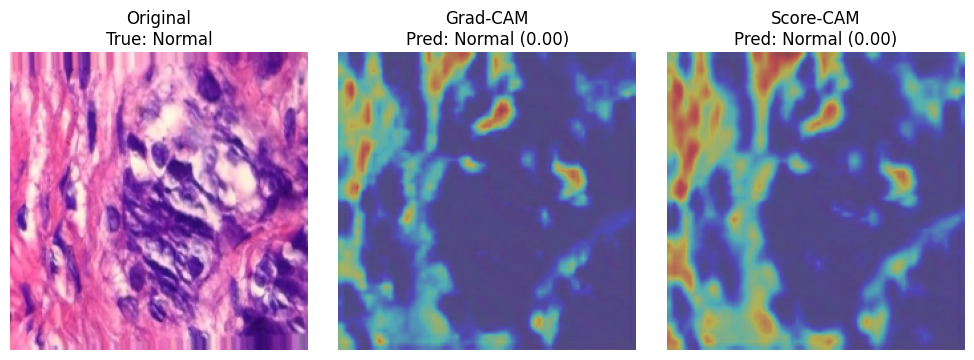

Saved: figures/conv2d_8_sample15_trueNormal_predNormal.png


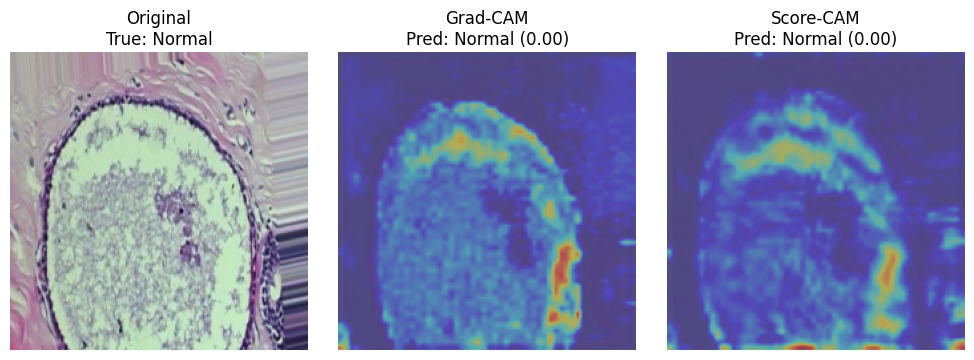

Saved: figures/conv2d_8_sample16_trueNormal_predNormal.png


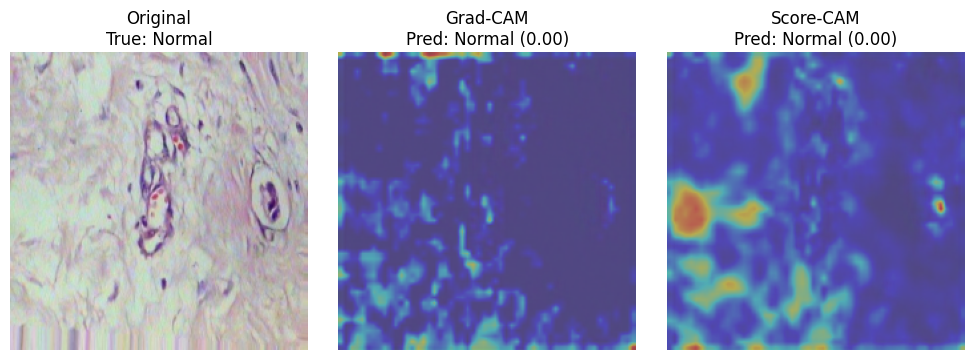

Saved: figures/conv2d_8_sample17_trueNormal_predNormal.png


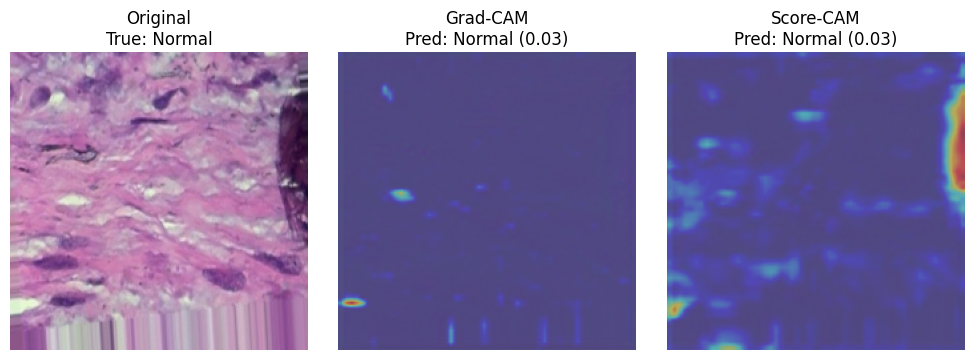

Saved: figures/conv2d_8_sample18_trueNormal_predNormal.png


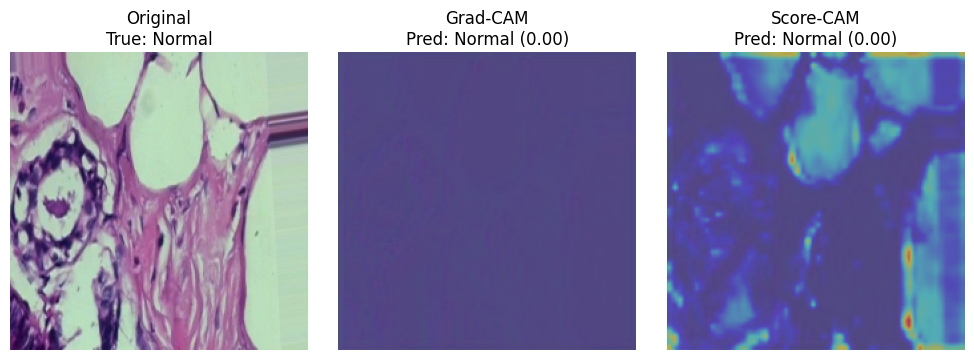

Saved: figures/conv2d_8_sample19_trueNormal_predNormal.png


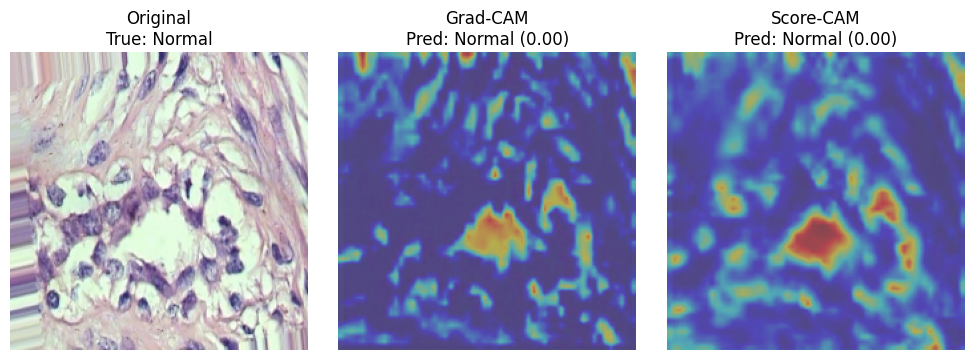

In [82]:
visualize_cam_comparison(X, y, encoder, decoder, classifier, layer_name="conv2d_8", num_samples=20,filter_label=0, 
                         savefig=True, filename_prefix="conv2d_8")

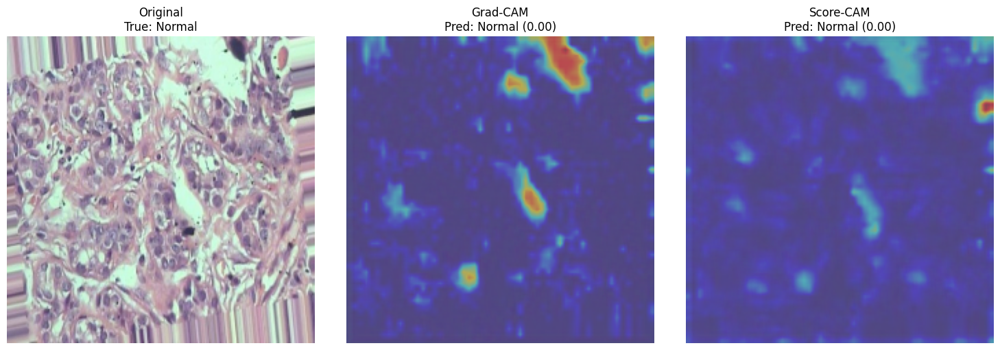

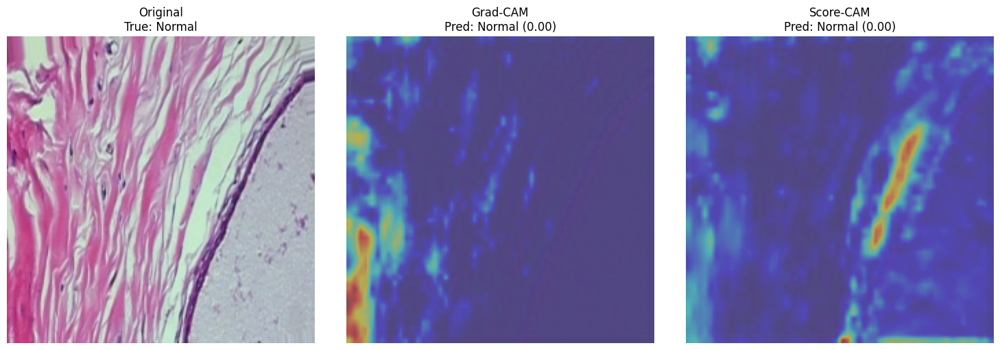

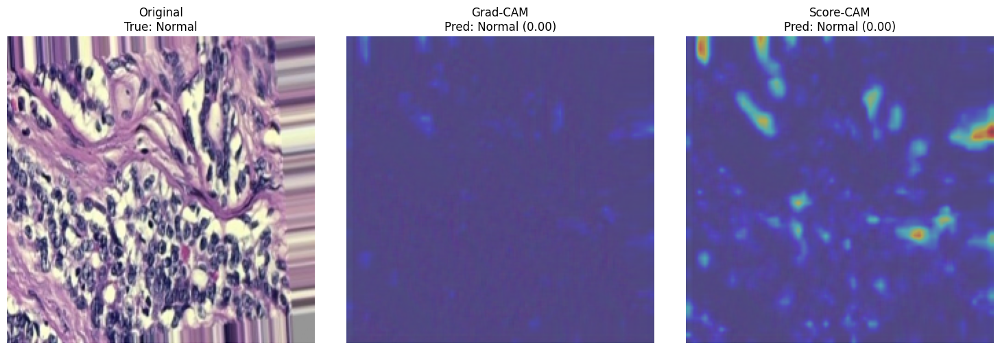

In [64]:
visualize_cam_comparison(X, y, encoder, decoder, classifier,layer_name='conv2d_8', filter_label=0, num_samples=3)
